In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import cv2
import numpy as np
import pywt
import matplotlib.pyplot as plt
from skimage.metrics import mean_squared_error
from google.colab.patches import cv2_imshow
from skimage import transform
from skimage.metrics import mean_squared_error

In [5]:
mona_lisa = '/content/drive/MyDrive/Images/5/mona lisa.jpg'
lena = '/content/drive/MyDrive/Images/5/Lena.bmp'

#4. Frequency Domain

##4.1. Fourier Transform

###4.1.1

First we must apply fourier transform on image . To do that we could use np.fft.fft2  but before that we must shift the image to the center using np.fft.fftshift . now we can get the magnitude and phase of the transformed image.

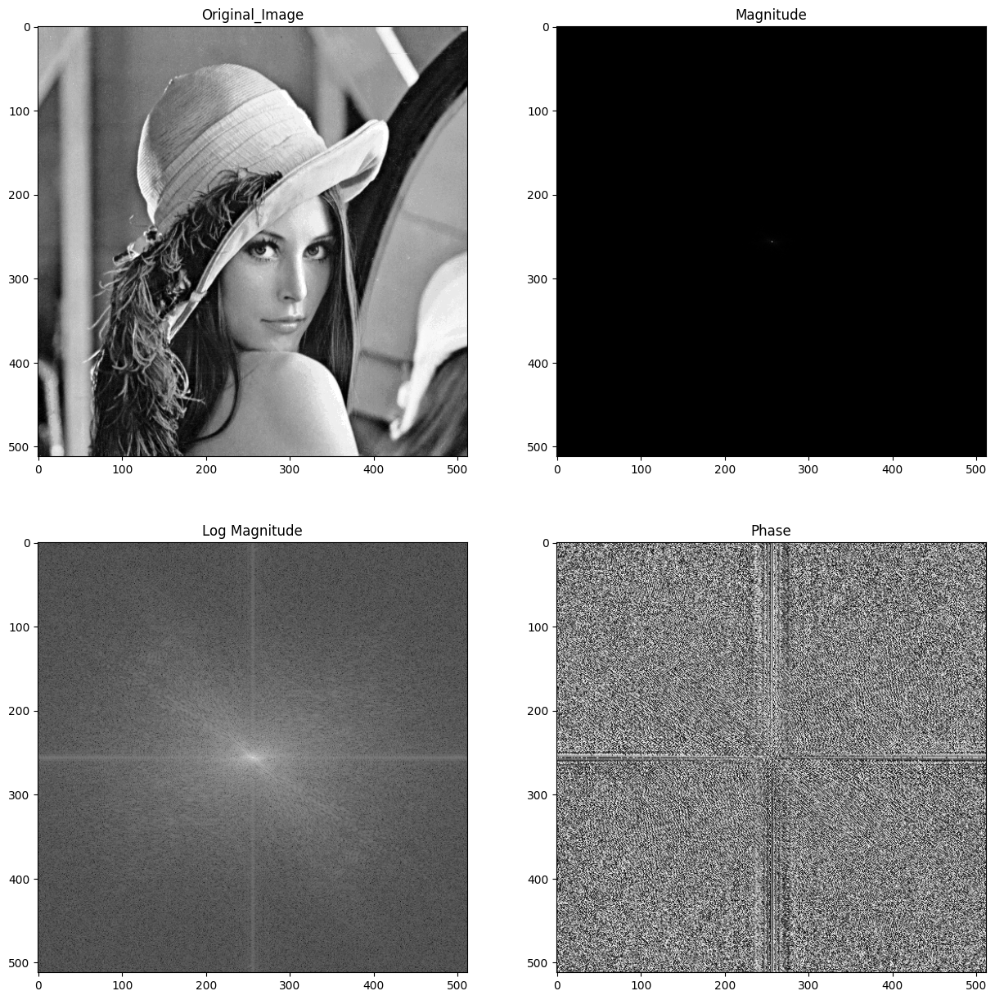

In [ ]:
img = cv2.imread(lena)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

img_fft = np.fft.fftshift(np.fft.fft2(img))
magnitude = np.abs(img_fft)
phase = np.angle(img_fft)

fig ,axs = plt.subplots(2,2,figsize=(15,15))

axs[0,0].imshow(img,cmap='gray')
axs[0,0].set_title('Original_Image')

axs[0,1].imshow(magnitude,cmap='gray')
axs[0,1].set_title('Magnitude')

axs[1,0].imshow(np.log1p(magnitude),cmap='gray')
axs[1,0].set_title('Log Magnitude')

axs[1,1].imshow(phase,cmap='gray')
axs[1,1].set_title('Phase')

plt.show()

Now we compute the fourior equivalent of our filters and plot the magnitudes.

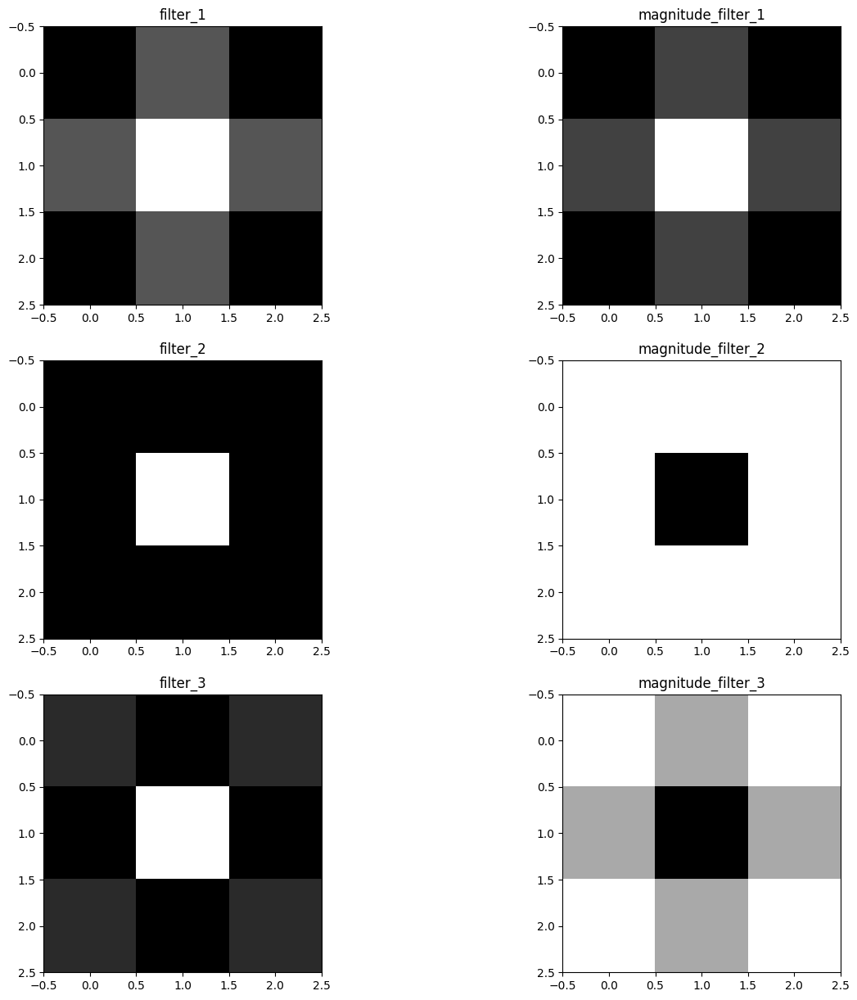

In [ ]:
filter_1 = [[1/16,2/16,1/16],
            [2/16,4/16,2/16],
            [1/16,2/16,1/16]]

filter_2 = [[-1,-1,-1],
            [-1,8,-1],
            [-1,-1,-1]]

filter_3 = [[0,-1,0],
            [-1,5,-1],
            [0,-1,0]]

fft_filter_1 = np.fft.fftshift(np.fft.fft2(filter_1))
magnitude_filter_1 = np.log1p(np.abs(fft_filter_1))

fft_filter_2 = np.fft.fftshift(np.fft.fft2(filter_2))
magnitude_filter_2 = np.log1p(np.abs(fft_filter_2))

fft_filter_3 = np.fft.fftshift(np.fft.fft2(filter_3))
magnitude_filter_3 = np.log1p(np.abs(fft_filter_3))

fig ,axs = plt.subplots(3,2,figsize=(15,15))

axs[0,0].imshow(filter_1,cmap='gray')
axs[0,0].set_title('filter_1')

axs[0,1].imshow(magnitude_filter_1,cmap='gray')
axs[0,1].set_title('magnitude_filter_1')

axs[1,0].imshow(filter_2,cmap='gray')
axs[1,0].set_title('filter_2')

axs[1,1].imshow(magnitude_filter_2,cmap='gray')
axs[1,1].set_title('magnitude_filter_2')

axs[2,0].imshow(filter_3,cmap='gray')
axs[2,0].set_title('filter_3')

axs[2,1].imshow(magnitude_filter_3,cmap='gray')
axs[2,1].set_title('magnitude_filter_3')

plt.show()

Here we define some defs that transfer our image and filter using fft and then apply the filter and get back to spatial domain.

In [ ]:
def pad_filter(filter, image):
    image_shape = image.shape
    pad_height = image_shape[0] - filter.shape[0]
    pad_width = image_shape[1] - filter.shape[1]
    padded_filter = np.pad(filter, ((0, pad_height), (0, pad_width)), 'constant')
    return padded_filter

In [ ]:
def apply_filter(img,filter):
  padded_filter = pad_filter(filter,img)
  img_fft = np.fft.fftshift(np.fft.fft2(img))
  fft_filter = np.fft.fftshift(np.fft.fft2(padded_filter))
  output = img_fft * fft_filter

  return output

Now we can apply them to our image.

***********
Original Image
***********


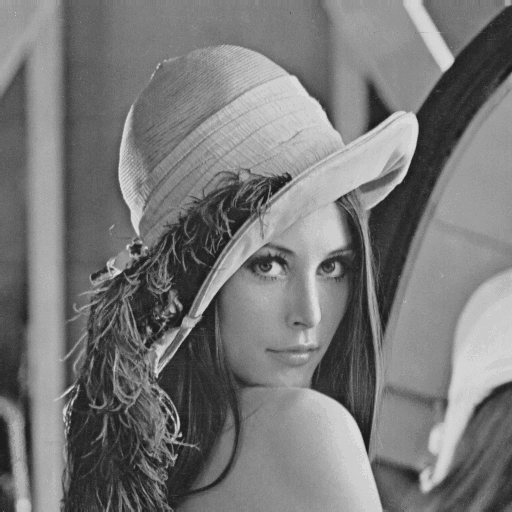

***********
Applying Filter_1 in Frequence Domain
***********


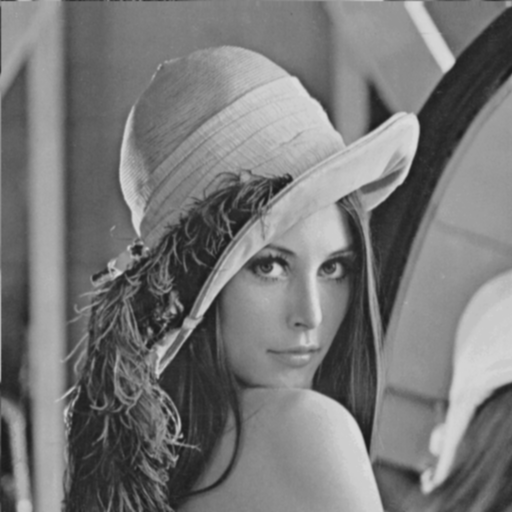

***********
Applying Filter_2 in Frequence Domain
***********


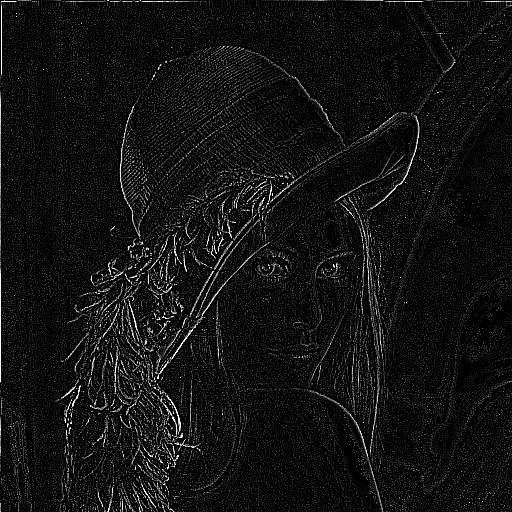

***********
Applying Filter_3 in Frequence Domain
***********


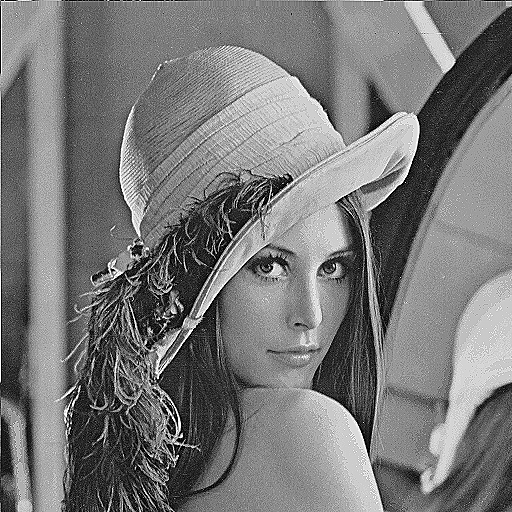

In [ ]:
img = cv2.imread(lena)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

filter_1 = np.array([[1/16,2/16,1/16],
                     [2/16,4/16,2/16],
                     [1/16,2/16,1/16]])

filter_2 = np.array([[-1,-1,-1],
                     [-1,8,-1],
                     [-1,-1,-1]])

filter_3 = np.array([[0,-1,0],
                     [-1,5,-1],
                     [0,-1,0]])

output_filter_1 = np.fft.ifft2(np.fft.ifftshift(apply_filter(img,filter_1)))
output_filter_2 = np.fft.ifft2(np.fft.ifftshift(apply_filter(img,filter_2)))
output_filter_3 = np.fft.ifft2(np.fft.ifftshift(apply_filter(img,filter_3)))

print("***********\nOriginal Image\n***********")
cv2_imshow(img)
print("***********\nApplying Filter_1 in Frequence Domain\n***********")
cv2_imshow(output_filter_1)
print("***********\nApplying Filter_2 in Frequence Domain\n***********")
cv2_imshow(output_filter_2)
print("***********\nApplying Filter_3 in Frequence Domain\n***********")
cv2_imshow(output_filter_3)

In the results we can see that

---


a ==> Smoothing filter

---


b ==> Edge detection

---


c ==> Edge enhancement

Filter a is seperable into two filters . one for rows and other for columns.

In [ ]:
def compute_1d_fft(filter_1d, length):
    padded_filter = np.pad(filter_1d, (0, length - len(filter_1d)), mode='constant')
    return fftpack.fft(padded_filter)

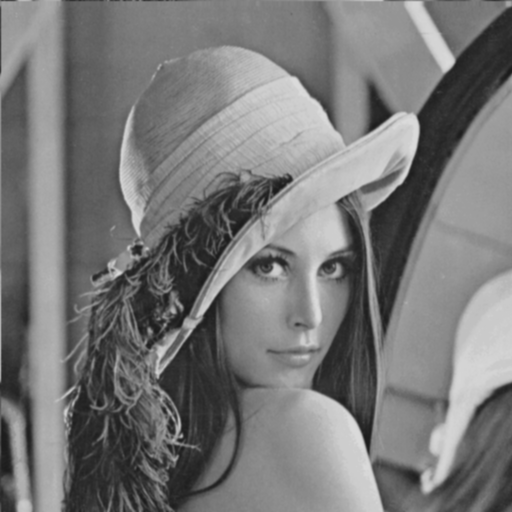

In [ ]:
from scipy import ndimage
from scipy import fftpack

img = cv2.imread(lena)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

'''
filter_1 = np.array([[1/16,2/16,1/16],
                     [2/16,4/16,2/16],
                     [1/16,2/16,1/16]])
'''

filter_1_row = np.array([1, 2, 1]) / 4
filter_1_col = np.array([1, 2, 1]) / 4

image_shape = img.shape
filter_fft_row = compute_1d_fft(filter_1_row, image_shape[1])
filter_fft_col = compute_1d_fft(filter_1_col, image_shape[0])

image_fft = fftpack.fft2(img)

filtered_fft = np.outer(filter_fft_col, np.ones(image_shape[1])) * image_fft
filtered_fft = np.outer(np.ones(image_shape[0]), filter_fft_row) * filtered_fft

filtered_image = fftpack.ifft2(filtered_fft)
filtered_image = np.real(filtered_image)

cv2_imshow(filtered_image)

We have achived the same result but with much less computation.

###4.1.2

In [ ]:
baboon = '/content/drive/MyDrive/Images/4/Baboon.bmp'
barbara = '/content/drive/MyDrive/Images/4/Barbara.bmp'
F16 = '/content/drive/MyDrive/Images/4/F16.bmp'
lena = '/content/drive/MyDrive/Images/4/Lena.bmp'

In [ ]:
img_list = []

baboon = cv2.imread(baboon).astype(np.float32)
baboon = cv2.cvtColor(baboon,cv2.COLOR_BGR2GRAY)
img_list.append([baboon])

barbara = cv2.imread(barbara).astype(np.float32)
barbara = cv2.cvtColor(barbara,cv2.COLOR_BGR2GRAY)
img_list.append([barbara])

F16 = cv2.imread(F16).astype(np.float32)
F16 = cv2.cvtColor(F16,cv2.COLOR_BGR2GRAY)
img_list.append([F16])

lena = cv2.imread(lena).astype(np.float32)
lena = cv2.cvtColor(lena,cv2.COLOR_BGR2GRAY)
img_list.append([lena])

In [ ]:
from copy import deepcopy

shifted_log = deepcopy(img_list)
shifted = deepcopy(img_list)
log = deepcopy(img_list)

for _ in range(len(shifted)):
    shifted[_].append(np.fft.fftshift(np.fft.fft2(shifted[_][0])))
    shifted[_].append(np.abs(shifted[_][-1]))

for _ in range(len(shifted_log)):
    shifted_log[_].append(np.fft.fftshift(np.fft.fft2(shifted_log[_][0])))
    shifted_log[_].append(np.log1p(np.abs(shifted_log[_][-1])))

for _ in range(len(log)):
    log[_].append(np.fft.fft2(log[_][0]))
    log[_].append(np.log1p(np.abs(log[_][-1])))

for _ in range(len(img_list)):
    img_list[_].append(np.fft.fft2(img_list[_][0]))
    img_list[_].append(np.abs(img_list[_][-1]))

Display the original image and its magnitude .

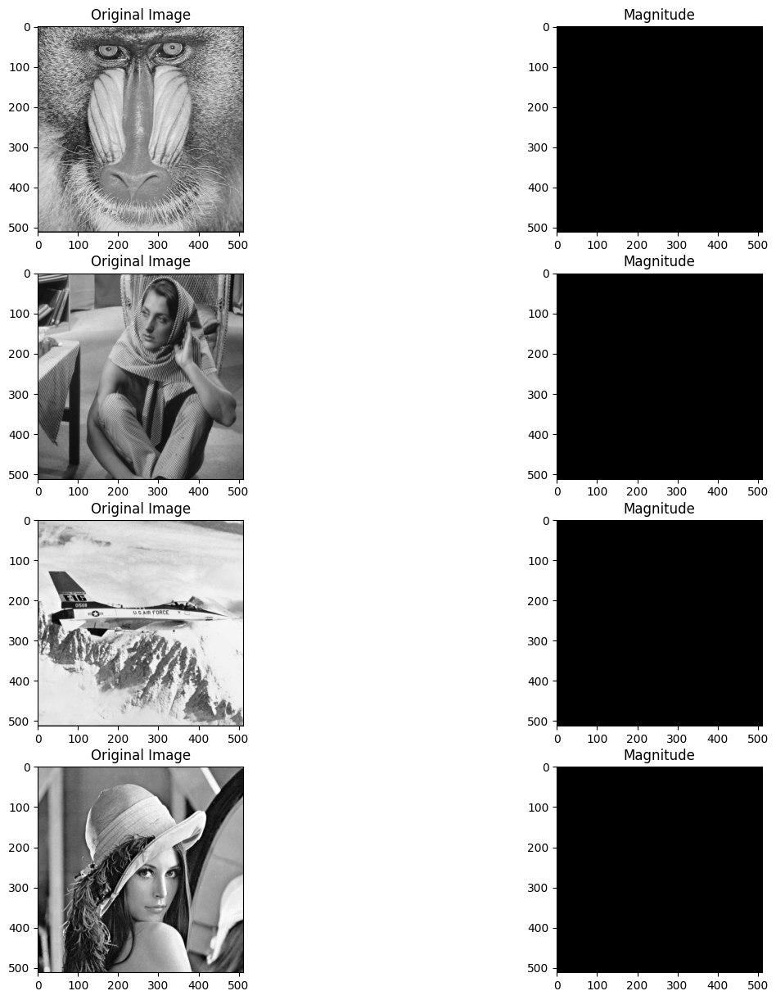

In [ ]:
fig ,axs = plt.subplots(4,2,figsize=(15,15))

axs[0,0].imshow(img_list[0][0].astype(np.float32),cmap='gray')
axs[0,0].set_title(f'Original Image')

axs[0,1].imshow(img_list[0][2].astype(np.float32),cmap='gray')
axs[0,1].set_title(f'Magnitude')

axs[1,0].imshow(img_list[1][0].astype(np.float32),cmap='gray')
axs[1,0].set_title(f'Original Image')

axs[1,1].imshow(img_list[1][2].astype(np.float32),cmap='gray')
axs[1,1].set_title(f'Magnitude')

axs[2,0].imshow(img_list[2][0].astype(np.float32),cmap='gray')
axs[2,0].set_title(f'Original Image')

axs[2,1].imshow(img_list[2][2].astype(np.float32),cmap='gray')
axs[2,1].set_title(f'Magnitude')

axs[3,0].imshow(img_list[3][0].astype(np.float32),cmap='gray')
axs[3,0].set_title(f'Original Image')

axs[3,1].imshow(img_list[3][2].astype(np.float32),cmap='gray')
axs[3,1].set_title(f'Magnitude')

plt.show()

Display the original image and its shifted magnitude .

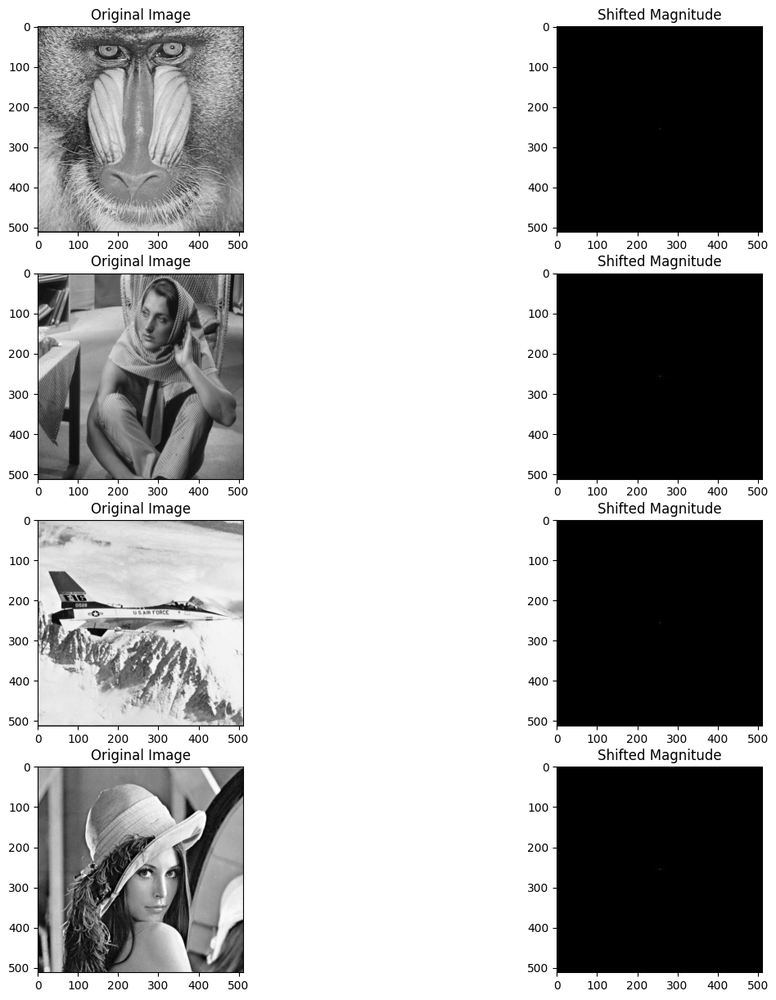

In [ ]:
fig ,axs = plt.subplots(4,2,figsize=(15,15))

axs[0,0].imshow(shifted[0][0].astype(np.float32),cmap='gray')
axs[0,0].set_title(f'Original Image')

axs[0,1].imshow(shifted[0][2].astype(np.float32),cmap='gray')
axs[0,1].set_title(f'Shifted Magnitude')

axs[1,0].imshow(shifted[1][0].astype(np.float32),cmap='gray')
axs[1,0].set_title(f'Original Image')

axs[1,1].imshow(shifted[1][2].astype(np.float32),cmap='gray')
axs[1,1].set_title(f'Shifted Magnitude')

axs[2,0].imshow(shifted[2][0].astype(np.float32),cmap='gray')
axs[2,0].set_title(f'Original Image')

axs[2,1].imshow(shifted[2][2].astype(np.float32),cmap='gray')
axs[2,1].set_title(f'Shifted Magnitude')

axs[3,0].imshow(shifted[3][0].astype(np.float32),cmap='gray')
axs[3,0].set_title(f'Original Image')

axs[3,1].imshow(shifted[3][2].astype(np.float32),cmap='gray')
axs[3,1].set_title(f'Shifted Magnitude')

plt.show()

Display the original image and its log magnitude .

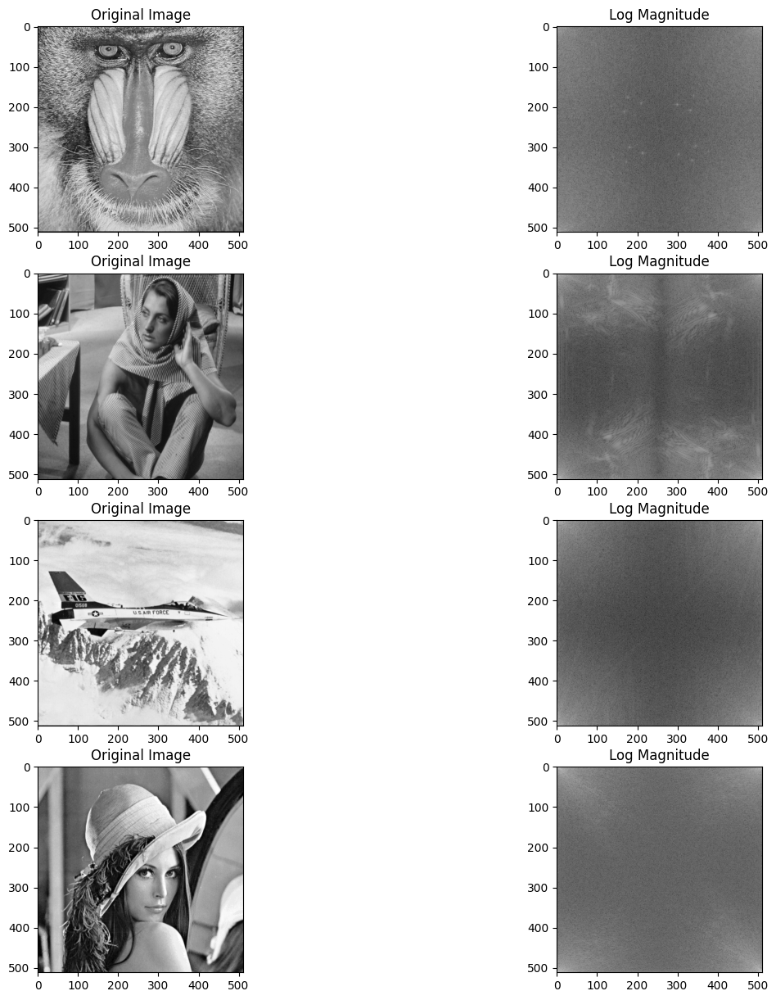

In [ ]:
fig ,axs = plt.subplots(4,2,figsize=(15,15))

axs[0,0].imshow(log[0][0].astype(np.float32),cmap='gray')
axs[0,0].set_title(f'Original Image')

axs[0,1].imshow(log[0][2].astype(np.float32),cmap='gray')
axs[0,1].set_title(f'Log Magnitude')

axs[1,0].imshow(log[1][0].astype(np.float32),cmap='gray')
axs[1,0].set_title(f'Original Image')

axs[1,1].imshow(log[1][2].astype(np.float32),cmap='gray')
axs[1,1].set_title(f'Log Magnitude')

axs[2,0].imshow(log[2][0].astype(np.float32),cmap='gray')
axs[2,0].set_title(f'Original Image')

axs[2,1].imshow(log[2][2].astype(np.float32),cmap='gray')
axs[2,1].set_title(f'Log Magnitude')

axs[3,0].imshow(log[3][0].astype(np.float32),cmap='gray')
axs[3,0].set_title(f'Original Image')

axs[3,1].imshow(log[3][2].astype(np.float32),cmap='gray')
axs[3,1].set_title(f'Log Magnitude')

plt.show()

Display the original image and its shifted log magnitude .

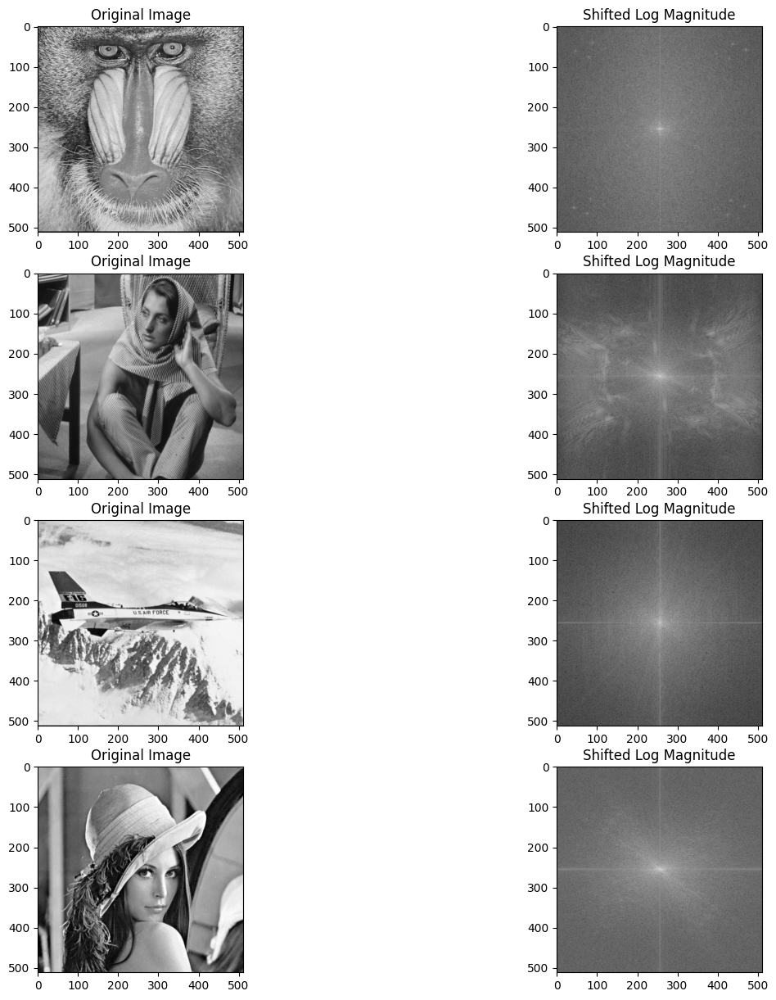

In [ ]:
fig ,axs = plt.subplots(4,2,figsize=(15,15))

axs[0,0].imshow(shifted_log[0][0].astype(np.float32),cmap='gray')
axs[0,0].set_title(f'Original Image')

axs[0,1].imshow(shifted_log[0][2].astype(np.float32),cmap='gray')
axs[0,1].set_title(f'Shifted Log Magnitude')

axs[1,0].imshow(shifted_log[1][0].astype(np.float32),cmap='gray')
axs[1,0].set_title(f'Original Image')

axs[1,1].imshow(shifted_log[1][2].astype(np.float32),cmap='gray')
axs[1,1].set_title(f'Shifted Log Magnitude')

axs[2,0].imshow(shifted_log[2][0].astype(np.float32),cmap='gray')
axs[2,0].set_title(f'Original Image')

axs[2,1].imshow(shifted_log[2][2].astype(np.float32),cmap='gray')
axs[2,1].set_title(f'Shifted Log Magnitude')

axs[3,0].imshow(shifted_log[3][0].astype(np.float32),cmap='gray')
axs[3,0].set_title(f'Original Image')

axs[3,1].imshow(shifted_log[3][2].astype(np.float32),cmap='gray')
axs[3,1].set_title(f'Shifted Log Magnitude')

plt.show()

Displaying Magnitude without shift and without log : we can see in the results that if we display the magnitude without shift and log , due to the difference between frequency domain center and spatial domain center , we will have few dots on the 4 side of magnitude .


---
Displaying Magnitude with shift and without log : after shifting the image we can see the dots come to the center of magnitude , so we can anaylise it much easier . but still we only have some small dots in the middle of image . the reason of this is that the dot in middle of image represent the sum of all the pixels in the image so the value of other pixels with respect to this one is ignorable and it will be displayed as zero .


---

Displaying Magnitude without shift and with log : if we get the logarithm of the magnitude then we can see better representation of other pixels due to scaling ability of logarithm .


---
Displaying Magnitude with shift and with log : finaly if we combine shifting and calculating log of magnitude we can have a image that the data represent in the center as it should after shifting and also the value of other pixels are much more noticable due to logarithm.


When a DFT coefficient have a large magnitude , it indicates a strong presence of a specefic frequency. So we can say the frequency range that have more presence in the signal will have larger magnitude.

##4.2. Filtering

###4.2.1

1.Lets say we want to compute the linear convolution of the image F(m,n) with size 256*256 , with a filter H(m,n) with size 11*11.
first we should zero pad the image to the filter size . the result will be 256 + 11 -1 = 266 . so the padded image will be 266*266 .

---
lets see the steps

1.   zero pad the image
2.   compute the DFTs of the F'(u,v) and H(u,v)
3.   point wise multiplication in the frequency domain : F'(u,v) * H(u,v)
4.   Inverse DFT to get back to the spatial domain wich is Y(m,n)

---

Another way to do this is as i implemented in 4.1.1 , is to pad the filter to image size and then compute the fourier transform of both and then multiply them in frequency domain and after that with inverse DFT you will have the filtered image result in spatial domain.
when you perform this way you will have the filter size of 256*256 after padding and the image will have the same size as before.

---

2.we have Z(m,n) = IDFT(DFT(X).*DFT(H)) were DFT and IDFT are 256*256 points.To obtain the linear covolution Y(m,n) from the circular convolution Z(m,n), the central 246*246 part of Z(m,n) should be taken.

###4.2.2

In [ ]:
def apply_filter(img,T,filter_type):
  N = img.shape[0]
  fft_img = np.fft.fft2(img)
  mask = np.ones_like(fft_img,dtype=np.uint8)

  match filter_type :
    case 'low_pass':
      center = N // 2
      size = int(T * N)
      mask[center - size:center + size,center - size:center + size] = 0
    case 'custom':
      size = int(T * N)
      mask[:size,:]=0
      mask[:,:size]=0
      mask[:,N-size:]=0

  filtered_fft = fft_img * mask
  filtered_img = np.abs(np.fft.ifft2(filtered_fft))
  filtered_img = np.clip(filtered_img,0,255).astype(np.uint8)
  return filtered_img

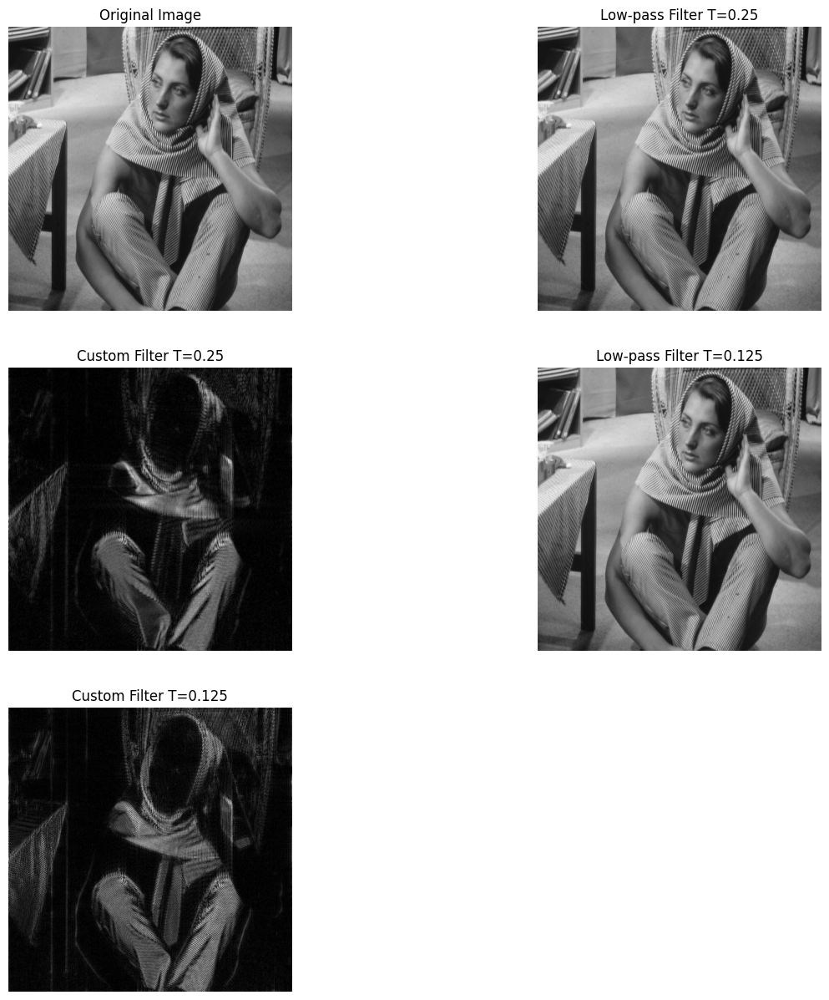

In [ ]:
img = cv2.imread(barbara)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

Ts = [1/4 , 1/8]

plt.figure(figsize=(15,15))

for i,T in enumerate(Ts):
  fft_img_low = apply_filter(img,T,filter_type='low_pass')
  fft_img_custom = apply_filter(img,T,filter_type='custom')

  plt.subplot(3, 2, 1)
  plt.title("Original Image")
  plt.imshow(img, cmap='gray')
  plt.axis('off')

  plt.subplot(3, 2, 2*i + 2)
  plt.title(f"Low-pass Filter T={T}")
  plt.imshow(fft_img_low, cmap='gray')
  plt.axis('off')

  plt.subplot(3, 2, 2*i + 3)
  plt.title(f"Custom Filter T={T}")
  plt.imshow(fft_img_custom, cmap='gray')
  plt.axis('off')

plt.show()


We can see that the first filter act as a low pass filter that will only let the low frequencies pass and block high frequencies so we will have a smoother image with less details.

---
For the second filter we can say it put value zero in some regions of image and it affect both low and high frequencies.

#5 Wavelet

##5.1.1

**Gaussian Pyramid**

<ipython-input-42-dd0cb57e1cd9>:9: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_reduce`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=True)


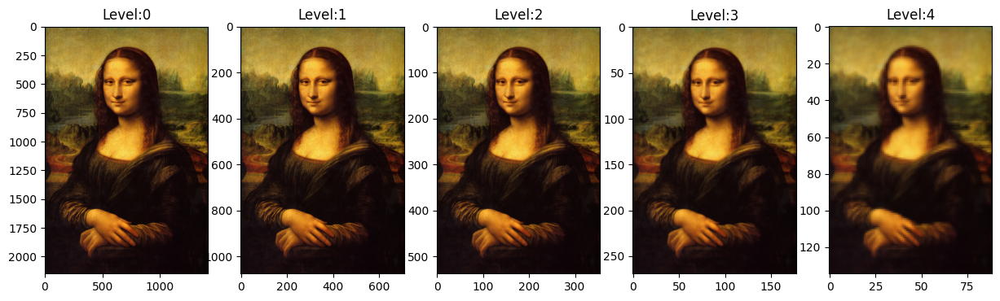

In [ ]:
img = cv2.imread(mona_lisa)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

level = 5
fig , axs = plt.subplots(1,level,figsize=(15,5))
# gp = []
pyramid = img
for i in range(level):
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=True)
  # gp.append(pyramid)
  axs[i].imshow(pyramid)
  axs[i].set_title(f"Level:{i}")
plt.show()

<ipython-input-55-5d9966e0d931>:8: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_reduce`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=False)


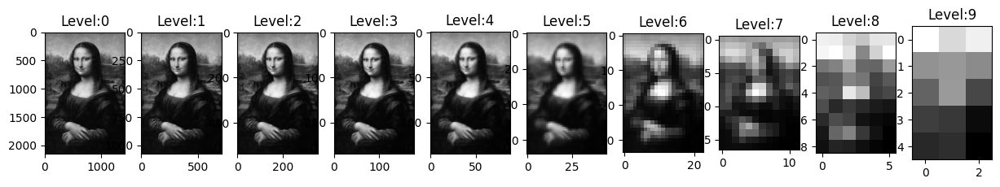

In [ ]:
img = cv2.imread(mona_lisa)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

level = 10
fig , axs = plt.subplots(1,level,figsize=(15,5))
pyramid = img
for i in range(level):
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=False)
  axs[i].imshow(pyramid,cmap='gray')
  axs[i].set_title(f"Level:{i}")
plt.show()

**Laplacian**

Color

<ipython-input-92-5f4a854df649>:15: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_reduce`. It will be removed in version 1.0. Please use `channel_axis` instead.
  mid = transform.pyramid_reduce(image,downscale=2,multichannel=True)
<ipython-input-92-5f4a854df649>:16: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_expand`. It will be removed in version 1.0. Please use `channel_axis` instead.
  upscaled = transform.pyramid_expand(mid,upscale=2,multichannel=True)


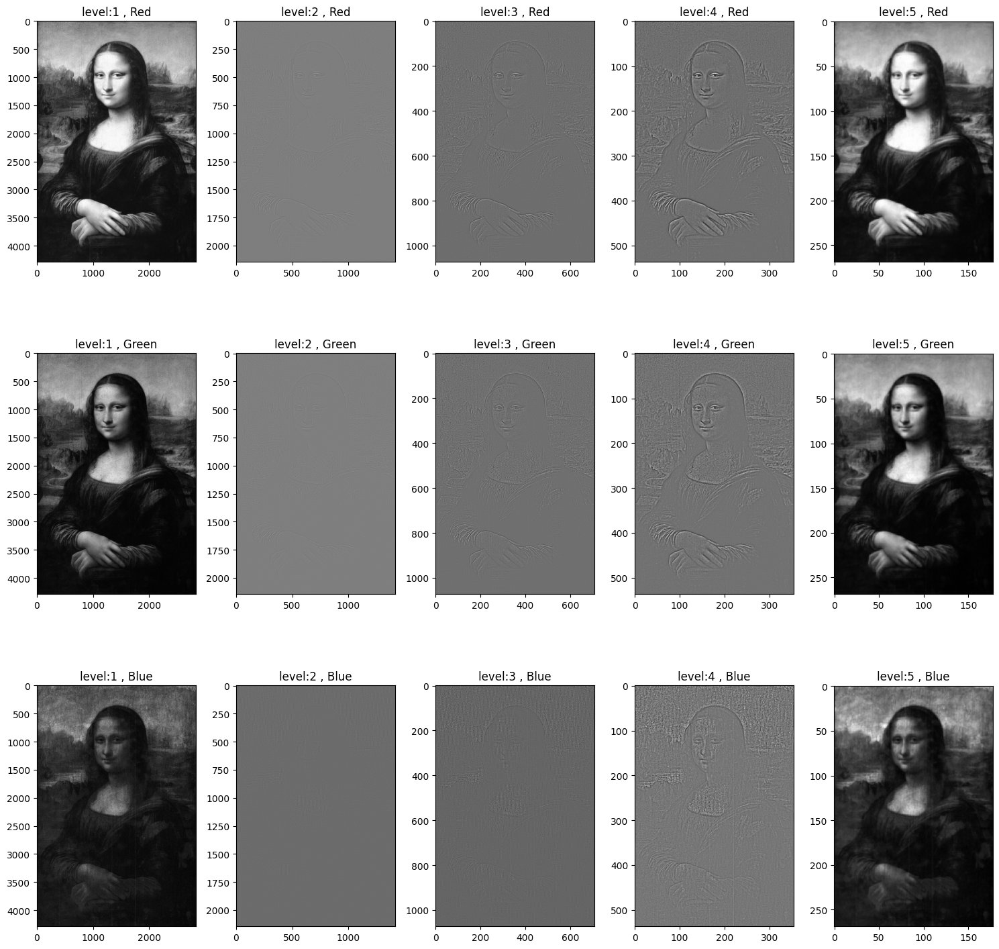

In [ ]:
img = cv2.imread(mona_lisa)
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

# rows,cols,channels = img.shape
# img = cv2.resize(img,(cols+1,rows+1))

level = 5

fig ,axs = plt.subplots(3,level,figsize=(15,15))

image = img.copy()
pyramid = []

for i in range(level-1):
  mid = transform.pyramid_reduce(image,downscale=2,multichannel=True)
  upscaled = transform.pyramid_expand(mid,upscale=2,multichannel=True)

  upscaled = cv2.resize(upscaled, dsize=(image.shape[1], image.shape[0]))

  lp = image - upscaled

  pyramid.append(lp)

  image = mid
  axs[0,i].imshow(lp[:,:,0],cmap='gray')
  axs[0,i].set_title(f"level:{i+1} , Red")
  axs[1,i].imshow(lp[:,:,1],cmap='gray')
  axs[1,i].set_title(f"level:{i+1} , Green")
  axs[2,i].imshow(lp[:,:,2],cmap='gray')
  axs[2,i].set_title(f"level:{i+1} , Blue")

pyramid.append(mid)
axs[0,level-1].imshow(pyramid[-1][:,:,0],cmap='gray')
axs[0,level-1].set_title(f"level:{level} , Red")
axs[1,level-1].imshow(pyramid[-1][:,:,1],cmap='gray')
axs[1,level-1].set_title(f"level:{level} , Green")
axs[2,level-1].imshow(pyramid[-1][:,:,2],cmap='gray')
axs[2,level-1].set_title(f"level:{level} , Blue")

plt.tight_layout()
plt.show()

Gray scale

<ipython-input-53-b0e95b088bb4>:12: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_reduce`. It will be removed in version 1.0. Please use `channel_axis` instead.
  mid = transform.pyramid_reduce(image,downscale=2,multichannel=False)
<ipython-input-53-b0e95b088bb4>:13: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_expand`. It will be removed in version 1.0. Please use `channel_axis` instead.
  upscaled = transform.pyramid_expand(mid,upscale=2,multichannel=False)


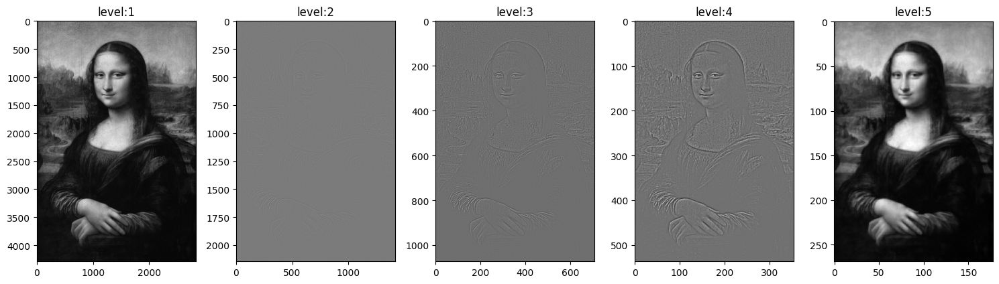

In [ ]:
img = cv2.imread(mona_lisa)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

level = 5

fig ,axs = plt.subplots(1,level,figsize=(15,5))

image = img.copy()
pyramid = []

for i in range(level-1):
  mid = transform.pyramid_reduce(image,downscale=2,multichannel=False)
  upscaled = transform.pyramid_expand(mid,upscale=2,multichannel=False)

  upscaled = cv2.resize(upscaled, dsize=(image.shape[1], image.shape[0]))

  lp = image - upscaled

  pyramid.append(lp)

  image = mid
  axs[i].imshow(lp,cmap='gray')
  axs[i].set_title(f"level:{i+1}")

pyramid.append(mid)
axs[level-1].imshow(pyramid[-1],cmap='gray')
axs[level-1].set_title(f"level:{level}")

plt.tight_layout()
plt.show()

#5.1.2

Separability: if we separate image into two 1D arrays(one for rows and one for columns) , we have reduced the complex 2D convlution to two simple 1D convolutions.

Cascading: applying a filter with standard sigma is equivalent to applying a filter with sigma/rad(2) twice. so we can achive the desired smoothing with applying smaller kernels that are faster to compute.

<ipython-input-98-5d9966e0d931>:8: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_reduce`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=False)


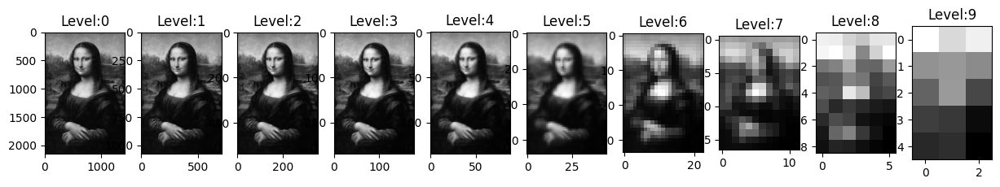

In [ ]:
img = cv2.imread(mona_lisa)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

level = 10
fig , axs = plt.subplots(1,level,figsize=(15,5))
pyramid = img
for i in range(level):
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=False)
  axs[i].imshow(pyramid,cmap='gray')
  axs[i].set_title(f"Level:{i}")
plt.show()

In [ ]:
import numpy as np
from scipy.ndimage import gaussian_filter1d

def generate_gaussian_kernel(sigma, kernel_size):
  """
  ساخت یک گوسین یک بعدی با مقادیر ورودی
  """
  x = np.linspace(-kernel_size // 2, kernel_size // 2, kernel_size + 1)
  kernel = np.exp(-x**2 / (2 * sigma**2))
  kernel /= np.sum(kernel)
  return kernel

def separate_filter(image, kernel,sigma):
  """
  فیتلر یک بعدی رو روی سطر و ستون ها به صورت جدا جدا اعمال میکنیم
  """
  # Horizontal filtering
  filtered_rows = gaussian_filter1d(image, sigma, axis=1)

  # Vertical filtering
  filtered_image = gaussian_filter1d(filtered_rows, sigma, axis=0)

  return filtered_image

def gaussian_pyramid(image, sigma_list,level):
  """
  ساخت هرم گوسین
  """
  pyramid = [image]

  for sigma in sigma_list:
    img = image.copy()
    l = []
    l.append(img)
    for i in range(level):
      # Create 1D Gaussian kernel
      kernel_size = int(6 * sigma + 1)
      kernel = generate_gaussian_kernel(sigma, kernel_size)

      # Apply separable filtering
      filtered_image = separate_filter(img, kernel,sigma)

      l.append(filtered_image)
      img = filtered_image

    # Add filtered image to the pyramid
    pyramid.append(l)

  return pyramid

image = cv2.imread(lena)
#sigma = 1 --> rad(2)sigma = np.sqrt(2) , sigma*2 = 2
sigma = 1
sigma_list = [sigma, np.sqrt(sigma), sigma*2]
level = 3
pyramid = gaussian_pyramid(image, sigma_list,level)

# ... (Use the smoothed images further)
# sigma_list.insert(0,'Original')

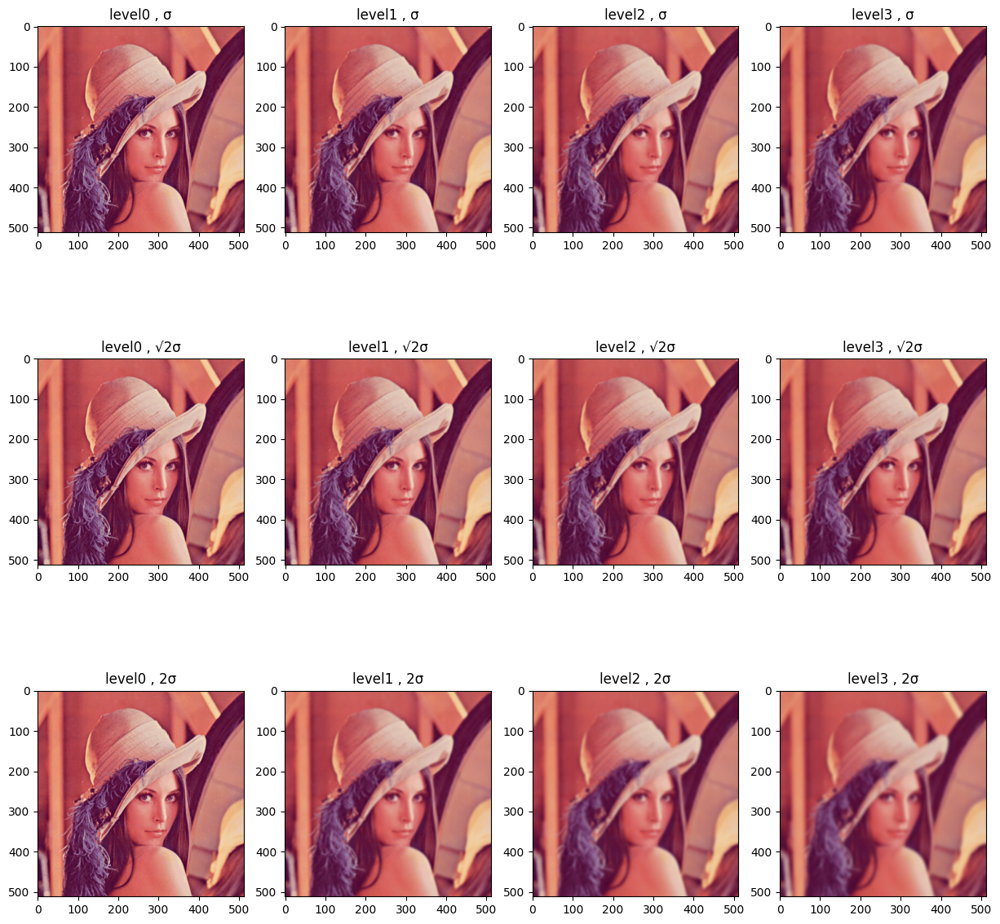

In [ ]:
fig,axs = plt.subplots(len(sigma_list),level+1,figsize=(15,15))

l_sigma = ['σ','√2σ','2σ']


for _ in range(level+1):
  pyramid[1][_] = cv2.cvtColor(pyramid[1][_],cv2.COLOR_BGR2RGB)
  axs[0][_].imshow(pyramid[1][_])
  axs[0][_].set_title(f"level{_} , {l_sigma[0]}")

for _ in range(level+1):
  pyramid[2][_] = cv2.cvtColor(pyramid[2][_],cv2.COLOR_BGR2RGB)
  axs[1][_].imshow(pyramid[2][_])
  axs[1][_].set_title(f"level{_} , {l_sigma[1]}")

for _ in range(level+1):
  pyramid[3][_] = cv2.cvtColor(pyramid[3][_],cv2.COLOR_BGR2RGB)
  axs[2][_].imshow(pyramid[3][_])
  axs[2][_].set_title(f"level{_} , {l_sigma[2]}")


we can see that separating to row and columns make our computation much faster and also cascading into different sigma's could result in reaching the goal faster or slower.

#5.1.3

*Approximation Pyramid Representation*

---


a : the answer is j level if we count the img itself as level 0 . so for N*N image with N=2^j we will have j level approximation pyramid . --> L = Log2(N)=J


---


b :  we can see that N^2 + (1/4)N^2 + (1/16)N^2 + .... = N^2(1 + 1/4 + 1/16 + ...) is approximatly equal to 1*1/3*N^2 .


---


c : from b we can see that we will only need around 33 percent more memory space than original image.


---


d : when we use pyramid we can have
*   **Multi_scale analysis** of an image that is useful for tasks like object detection where objects can appear at different size in the image.for example we can find differnet cars with different size and angles in the approximation pyramid that will help us detect cars more accuratly.
*   **Efficient Feature Extraction** : by processing features at coarser level first , we can reduce the computation and speed up the processing.for example in car example from last part , we can find the pyramid for both our car template and the image we are checking and then find the cars in low levels and then when we want to do the same at higher level we can only check the area in that car apeared in low level , so we compute only that window and will have reduce in computation power need and in time.
*   **Image Denoising** : by decomposing image into different scales , noise can be isolated and removed more efficiently .for example we can denoise the car exmaple(if noisy) in 4 levels and we can upscaled the denoised img after that . we will see that denoising in different image size and also different orientations(horizontal , vertical and diagonal) we will detect and remove noise better.




***Residual Pyramid***

---


a : residual pyramid had same level as approximation pyramid wich is j .


---

b : it also had the same pixel count as approximation pyramid.

---
c : from b we can see that we will only need around 33 percent more memory space than original image.


---

d : if we look at residual pyramid frequency composition we can see that in the first image we save only the high frequencies and pass the low frequencies down to deeper levels and we can see that , we are able to reconstruct the image using this frequencies . this property give us the ability to compress information(for example using laplacian pyramid).

<ipython-input-6-5fb70a3d4250>:8: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_reduce`. It will be removed in version 1.0. Please use `channel_axis` instead.
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=False)


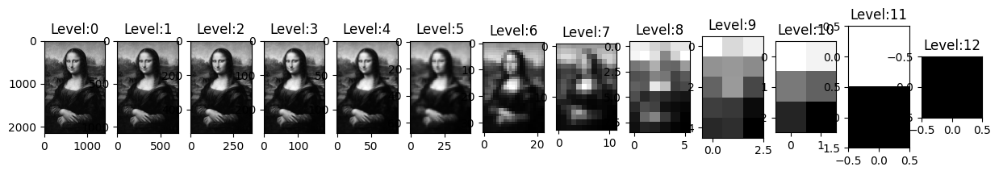

In [ ]:
img = cv2.imread(mona_lisa)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

level = 13
fig , axs = plt.subplots(1,level,figsize=(15,5))
pyramid = img
for i in range(level):
  pyramid = transform.pyramid_reduce(pyramid,downscale=2,multichannel=False)
  axs[i].imshow(pyramid,cmap='gray')
  axs[i].set_title(f"Level:{i}")
plt.show()

we applied gaussian pyramid for 13 levels wich is the max level possible as we can see in the last level we have only one pixel approximation of the image . we can see at each level we get and image half the size of the last level .
lets say we want to find mona lisa , we can see the resembelence at level 7 with eye , so if we search for her in the 7th level we will need to only search  17x12 pixels wich is much faster than 2145x1418 pixels.


---

also we can use each level as the approximation of our image wich reduce the need of memory space .


---

also we could do this with laplacian pyramid and compress the image while we can have the exact image.

#5.1.4

In [ ]:
img = cv2.imread(lena)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

In [ ]:
def pyramid_decomposition(image):

  approximation_pyramid = [image]
  prediction_residual_pyramid = []

  for _ in range(3):
    current_level = approximation_pyramid[-1]

    # Downsample for next level approximation
    rows, cols = len(current_level), len(current_level[0])
    next_level = [[0 for _ in range(cols // 2)] for _ in range(rows // 2)]
    for i in range(0, rows, 2):
      for j in range(0, cols, 2):
        # Average 2x2 block
        block_sum = sum(sum(row[j:j+2]) for row in current_level[i:i+2])
        next_level[i // 2][j // 2] = block_sum // 4

    # Append downsampled level to pyramid
    approximation_pyramid.append(np.array(next_level))

    # Compute prediction residual for current level
    prediction_residual = [[0 for _ in range(cols)] for _ in range(rows)]
    for i in range(rows):
      for j in range(cols):
        # Upsample with pixel replication
        upsampled_value = approximation_pyramid[_+1][i // 2][j // 2]

        # Prediction residual
        prediction_residual[i][j] = current_level[i][j] - upsampled_value

    # Append prediction residual to pyramid
    prediction_residual_pyramid.append(np.array(prediction_residual))

  return approximation_pyramid, prediction_residual_pyramid

# Example usage
image = img

approximation_pyramid, prediction_residual_pyramid = pyramid_decomposition(image)

Text(0.5, 1.0, 'prediction_residual_pyramid level:3')

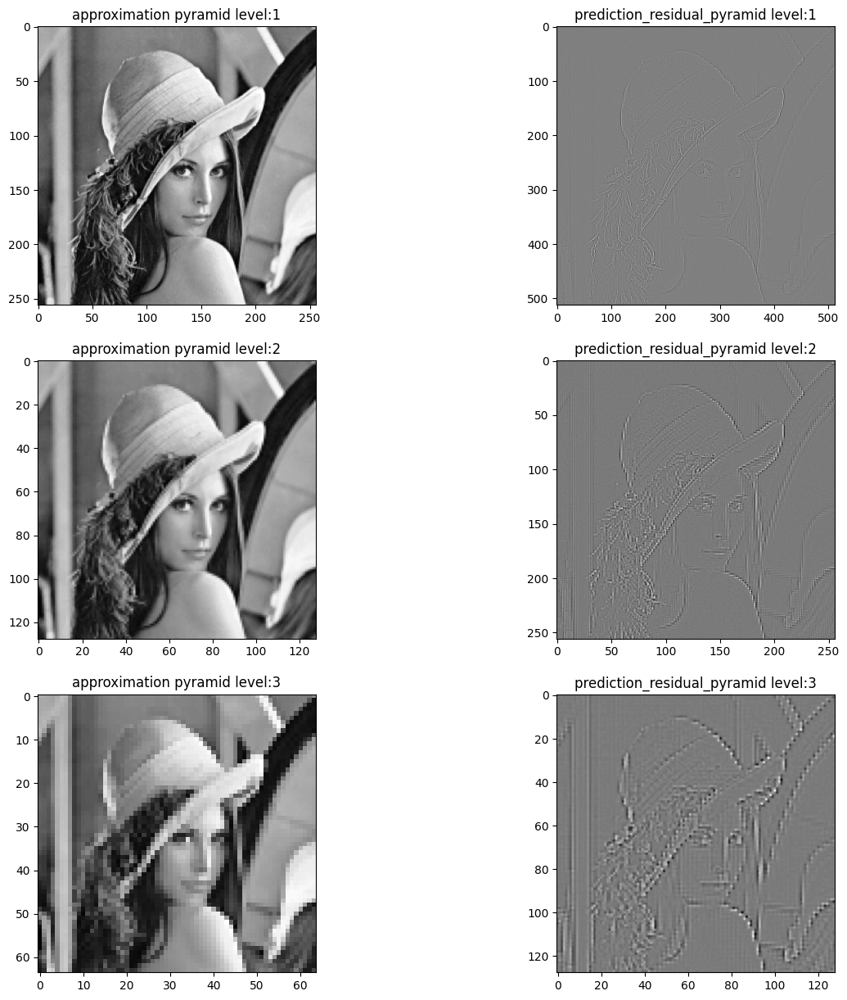

In [ ]:
fig ,axs = plt.subplots(3,2,figsize=(15,15))

axs[0,0].imshow(approximation_pyramid[1],cmap='gray')
axs[0,0].set_title(f"approximation pyramid level:1")

axs[1,0].imshow(approximation_pyramid[2],cmap='gray')
axs[1,0].set_title(f"approximation pyramid level:2")

axs[2,0].imshow(approximation_pyramid[3],cmap='gray')
axs[2,0].set_title(f"approximation pyramid level:3")

axs[0,1].imshow(prediction_residual_pyramid[0],cmap='gray')
axs[0,1].set_title(f"prediction_residual_pyramid level:1")

axs[1,1].imshow(prediction_residual_pyramid[1],cmap='gray')
axs[1,1].set_title(f"prediction_residual_pyramid level:2")

axs[2,1].imshow(prediction_residual_pyramid[2],cmap='gray')
axs[2,1].set_title(f"prediction_residual_pyramid level:3")

**********
512
**********


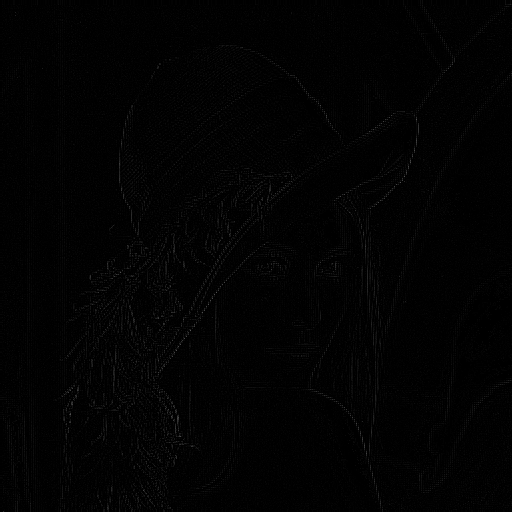

**********
256
**********


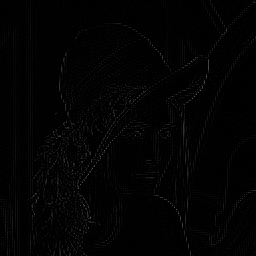

**********
128
**********


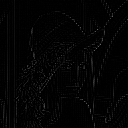

In [ ]:
for _ in prediction_residual_pyramid:
  print(f"**********\n{len(_)}\n**********")
  cv2_imshow(_)


we can see that after creating approximation pyramid with 2*2 averaging filter , in each level we will have a image with half size of the last level which is blurred(result of 2*2 averaging) in comparision with last level(lower size and lower pixel quality)


---

for residual pyramid we can see that each level give us difference of last level and next level which show us what information did we removed from the image . beacuse we are using pixel replication we can see that after each level our image display a little more pixel form .

#5.1.5

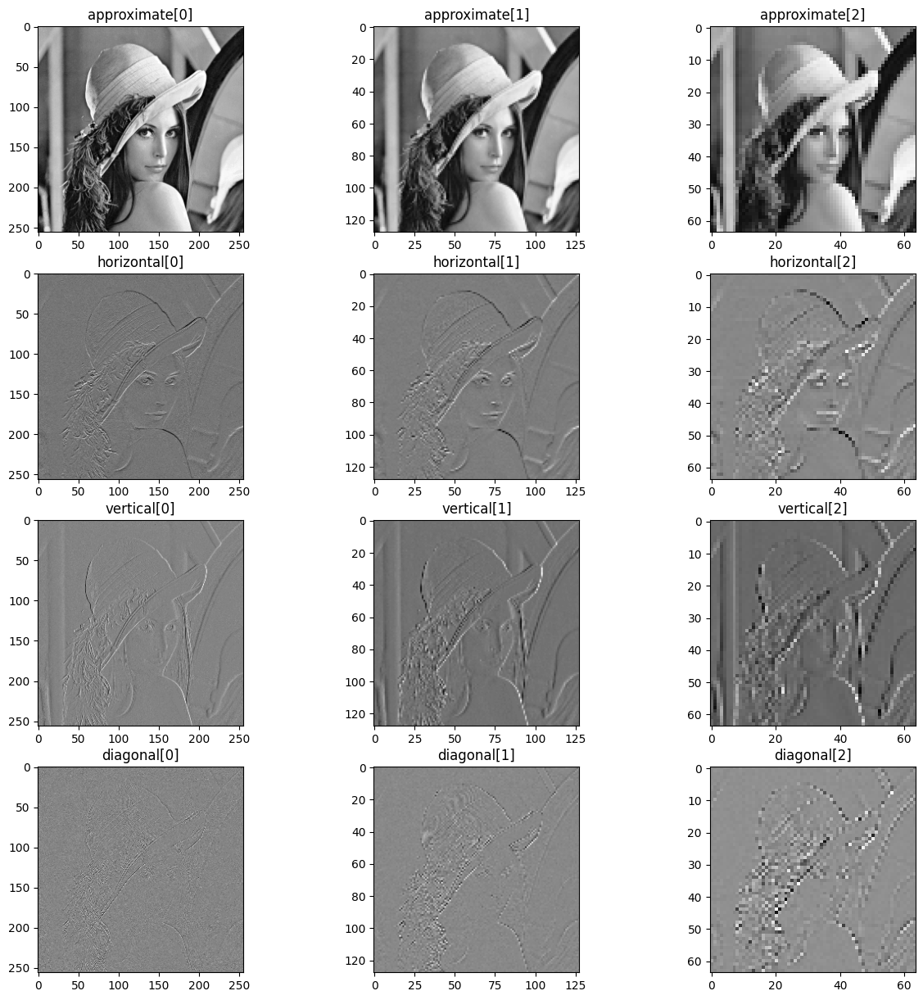

In [ ]:
img = cv2.imread(lena)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

n_level = 3

approximate , horizontal , vertical , diagonal = [],[],[],[]

start_img = img.copy()
for i in range(1,n_level+1):
  a, (h,v,d) = pywt.dwt2(start_img,'haar')
  approximate.append(a)
  horizontal.append(h)
  vertical.append(v)
  diagonal.append(d)
  start_img = a

fig , axs = plt.subplots(4,3,figsize=(15,15))

l = [["approximate" , approximate],["horizontal",horizontal],["vertical", vertical],["diagonal",diagonal]]
for j in range(3):
  for i in range(4):
    axs[i,j].imshow(l[i][1][j],cmap='gray')
    axs[i,j].set_title(f"{l[i][0]}[{j}]")

plt.show()

Gaussian pyramid focuses on representing the image while saving low frequency information .
Suitable for smoothing and downsampling applications.


---

Wavelet pyramid on the other hand focus on multi_scale representation by capturing both high and low frequency information .
Suitable for detailed image analysis.

---

We can see that the output of the 5.1.2 is blured after each level . when looking at outputs of 5.1.5 we can see that the image is perfectly decomposed into its horizontal, vertical and diagonal edges that give us the ability to analyse image even better. Also when we use Gaussian pyramid due to removing the high frequencies we lose data but in wavelet we keep both high and low frequencies so we can recreate our image , exactly as it was before.

#5.1.6

In [16]:
def quantizer(coeffs,gamma):
  return gamma * np.sign(coeffs)*np.floor(np.abs(coeffs)/gamma)

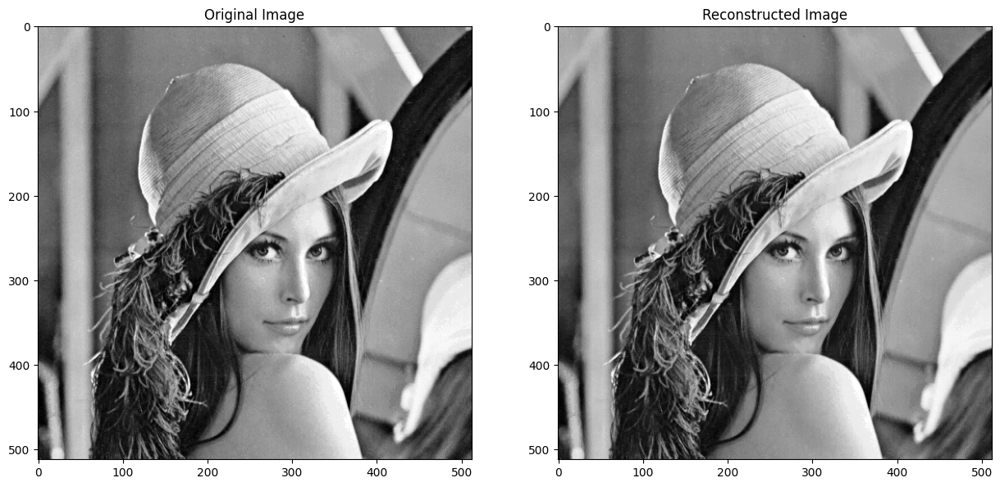

In [47]:
"""
step 1 : create wavelet pyramid
step 2 : Quantize wavelet coefficients
step 3 : Reconstruct the image using quantized coefficients
step 4 : Report PSNR and discuss the results.
"""

#implementing wavelet transform and save coefficients in lists
img = cv2.imread(lena)
img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

n_level = 3

approximate , horizontal , vertical , diagonal = [],[],[],[]

start_img = img.copy()
for i in range(1,n_level+1):
  a, (h,v,d) = pywt.dwt2(start_img,'haar')
  approximate.append(a)
  horizontal.append(h)
  vertical.append(v)
  diagonal.append(d)
  start_img = a

#Quantization of coefficients
gamma = 2
for i in range(n_level):
  approximate[i] = quantizer(approximate[i],gamma)
  horizontal[i] = quantizer(horizontal[i],gamma)
  vertical[i] = quantizer(vertical[i],gamma)
  diagonal[i] = quantizer(diagonal[i],gamma)

#Reconstruct image
reconstructed_img = approximate[-1]
for i in range(n_level - 1 ,-1,-1):
  reconstructed_img = pywt.idwt2((reconstructed_img,(horizontal[i],vertical[i],diagonal[i])),'haar')

fig , axs = plt.subplots(1,2,figsize=(15,15))

axs[0].imshow(img,cmap='gray')
axs[0].set_title('Original Image')

axs[1].imshow(reconstructed_img,cmap='gray')
axs[1].set_title('Reconstructed Image')

plt.show()

When we quantize out coefficients we are decreasing the percision of them but also we are compressing the data .

---

here we can see that after Quantization , the quality of image did not change much and it is very similar to the original image(in the next part we will see a metric to measure this similarity)

---

The differences of the original image and reconstructed image is mainly in

1.   Loss of Details : Reconstructed image contain less detailes due to quantization
2.   Compression : Lossing details will result in need of less memory to represent the reconstructed image
3.   Quality Reduction : With loss in detail we will have a decay in quality



In [46]:
from skimage.metrics import peak_signal_noise_ratio as psnr
psnr_value = psnr(img, reconstructed_img)
# print(f"PSNR : {psnr}")
print(f"PSNR value: {psnr_value:.2f} dB")

PSNR value: 47.86 dB


<ipython-input-46-7db5796a7dda>:2: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = psnr(img, reconstructed_img)


PSNR is a metric used to measure how good is a reconstructed image compared to the original image.

---

The high PSNR of 47.68 db show us that the reconstructed image is pretty close to the original image.